In [ ]:
!pip install Keras-Preprocessing

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 KB 1.3 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!7z x /content/gdrive/MyDrive/data/Project1.7z


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,12 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (50657),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/gdrive/MyDrive/data/                                       1 file, 1093147549 bytes (1043 MiB)

Extracting archive: /content/gdrive/MyDrive/data/Project1.7z
--
Path = /content/gdrive/MyDrive/data/Project1.7z
Type = 7z
Physical Size = 1093147549
Headers Size = 921431
Method = LZMA2:24
Solid = +
Blocks = 1

  0%      0% 3        0% 473 - PROJECT/bio/TRAIN.1_BIODEG_ORI_1042.jpg                                                    0% 568 - PROJECT/bio/TRAIN.1_BIODEG_ORI_10505.jpg                      

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
import tensorflow as tf
warnings.filterwarnings('ignore')

In [ ]:
input_path = []
label = []

for class_name in os.listdir("PROJECT"):
    for path in os.listdir("PROJECT/"+class_name):
        if class_name == 'bio':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PROJECT", class_name, path))
print(input_path[0], label[0])

PROJECT/bio/TRAIN.1_BIODEG_ORI_1877.jpg 0


In [ ]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df

,images,label
0,PROJECT/nbio/TRAIN.1_NBIODEG_VFL_5674.jpg,1
1,PROJECT/bio/TRAIN.1_BIODEG_ORI_12050.jpg,0
2,PROJECT/bio/TRAIN.1_BIODEG_ORI_18192.jpg,0
3,PROJECT/bio/TRAIN.1_BIODEG_ORI_24019.jpg,0
4,PROJECT/bio/TRAIN.2_BIODEG_ORI_947.jpg,0
...,...,...
149800,PROJECT/bio/TRAIN.2_BIODEG_ORI_23480.jpg,0
149801,PROJECT/bio/TRAIN.2_BIODEG_ORI_24028.jpg,0
149802,PROJECT/bio/TRAIN.3_BIODEG_ORI_20956.jpg,0
149803,PROJECT/bio/TRAIN.2_BIODEG_ORI_1112.jpg,0


In [ ]:
######
for i in df['images']:
    if '.jpg' not in i:
        print(i)

PROJECT/bio/TRAIN.3_BIODEG_ORI_10323.jpeg
PROJECT/bio/TRAIN.2_BIODEG_ORI_27681.jpeg
PROJECT/bio/TRAIN.1_BIODEG_ORI_17448.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_ORI_3521.jpeg
PROJECT/bio/TRAIN.2_BIODEG_ORI_16538.jpeg
PROJECT/bio/TRAIN.1_BIODEG_ORI_1102.jpeg
PROJECT/nbio/TRAIN.1_NBIODEG_HFL_1402.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_CCW_3521.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_CCW_705.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_HFL_705.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_VFL_702.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_VFL_1921.jpeg
PROJECT/bio/TRAIN.1_BIODEG_ORI_28256.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_CCW_1921.jpeg
PROJECT/bio/TRAIN.3_BIODEG_ORI_7205.jpeg
PROJECT/nbio/TRAIN.1_NBIODEG_CCW_1402.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_HFL_654.jpeg
PROJECT/bio/TRAIN.3_BIODEG_ORI_19554.jpeg
PROJECT/nbio/TRAIN.1_NBIODEG_CWR_1402.jpeg
PROJECT/bio/TRAIN.1_BIODEG_ORI_9262.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_ORI_1921.jpeg
PROJECT/nbio/TRAIN.2_NBIODEG_ORI_654.jpeg
PROJECT/bio/TRAIN.1_BIODEG_ORI_9529.jpeg
PROJECT/bio/TRAIN.3_BIODEG_ORI

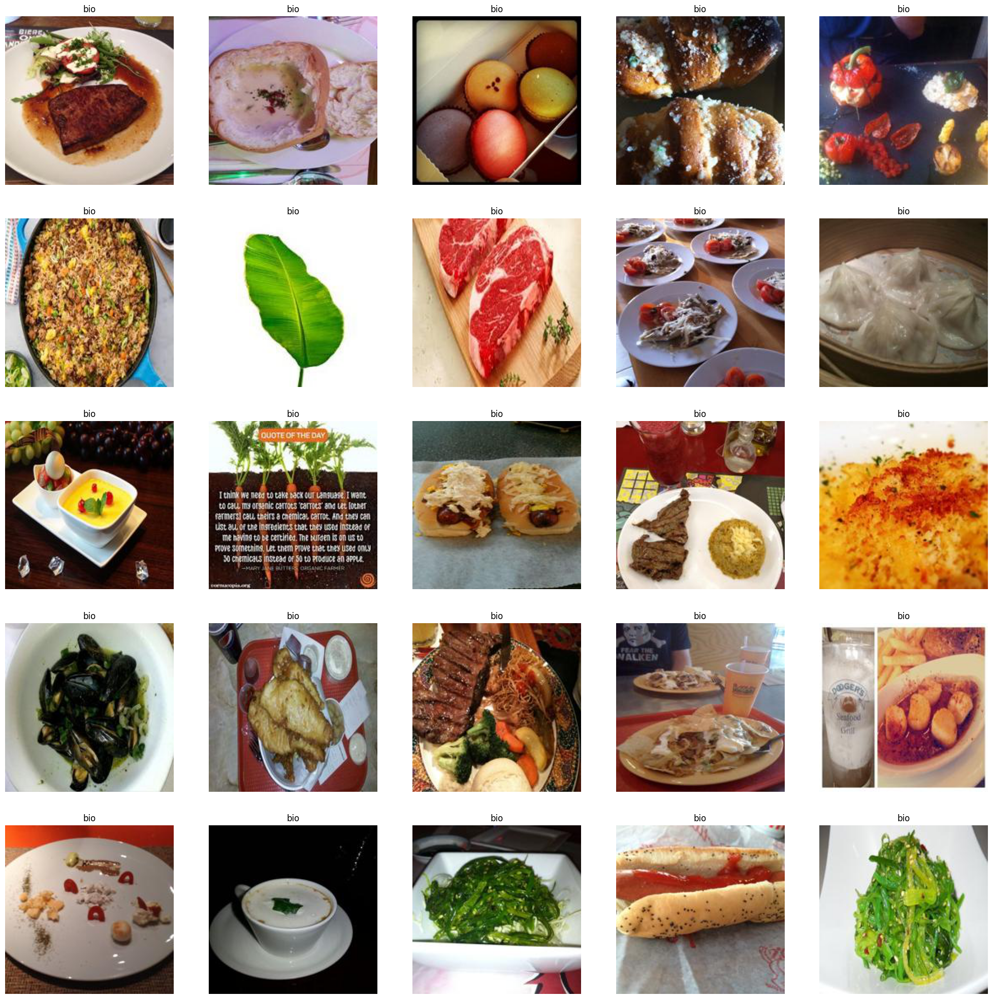

In [ ]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = tf.keras.utils.load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('bio')
    plt.axis('off')

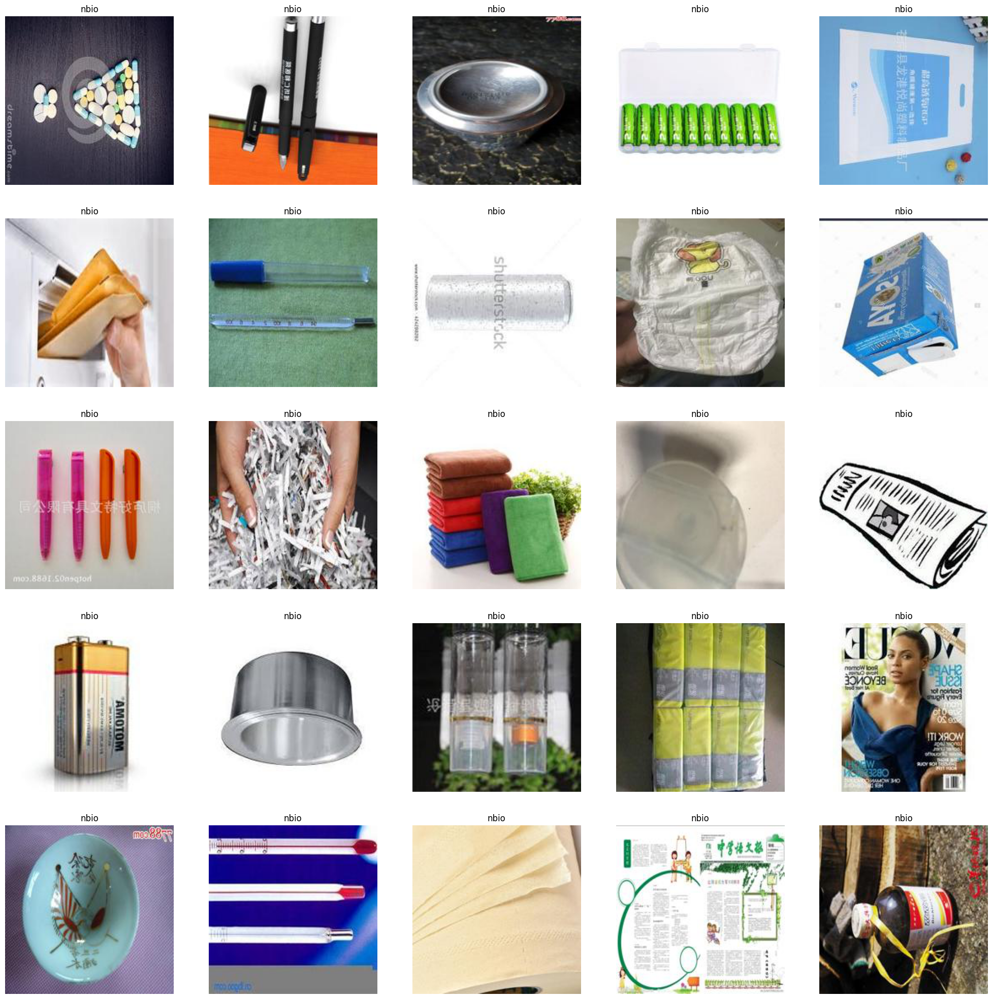

In [ ]:
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = tf.keras.utils.load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('nbio')
    plt.axis('off')

In [ ]:
df['label'] = df['label'].astype('str')
df

,images,label
0,PROJECT/nbio/TRAIN.1_NBIODEG_VFL_5674.jpg,1
1,PROJECT/bio/TRAIN.1_BIODEG_ORI_12050.jpg,0
2,PROJECT/bio/TRAIN.1_BIODEG_ORI_18192.jpg,0
3,PROJECT/bio/TRAIN.1_BIODEG_ORI_24019.jpg,0
4,PROJECT/bio/TRAIN.2_BIODEG_ORI_947.jpg,0
...,...,...
149800,PROJECT/bio/TRAIN.2_BIODEG_ORI_23480.jpg,0
149801,PROJECT/bio/TRAIN.2_BIODEG_ORI_24028.jpg,0
149802,PROJECT/bio/TRAIN.3_BIODEG_ORI_20956.jpg,0
149803,PROJECT/bio/TRAIN.2_BIODEG_ORI_1112.jpg,0


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import os

import matplotlib.pyplot as plt
import matplotlib.image as img
import seaborn as sns

'''setting seed'''
seed = 0
np.random.seed(seed)
tf.random.set_seed(3)

In [ ]:
from sklearn.model_selection import train_test_split
train_set, valid_set = train_test_split(df, test_size=0.2,random_state=seed)

In [ ]:
train_set.shape, valid_set.shape

((119844, 2), (29961, 2))

train set distribution:
 0    71863
1    47981
Name: label, dtype: int64

valid set distribution:
 0    18020
1    11941
Name: label, dtype: int64



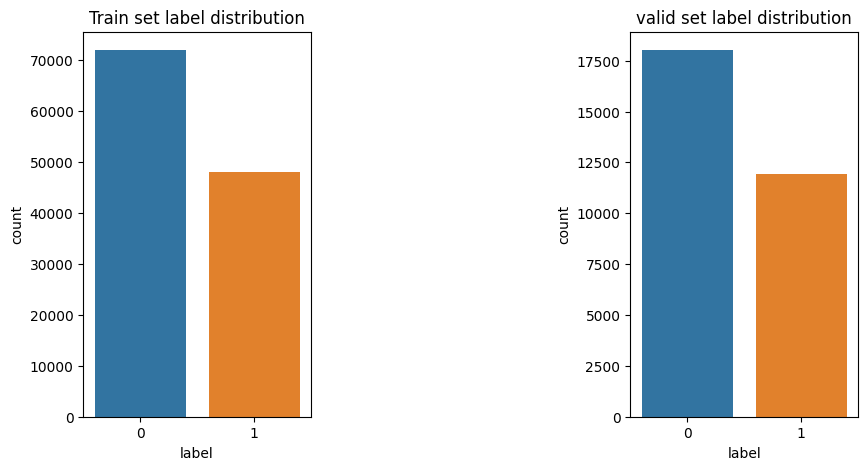

In [ ]:
print('train set distribution:\n',train_set['label'].value_counts())
print('\nvalid set distribution:\n',valid_set['label'].value_counts())
print()

plt.figure(figsize=(10,5))
plt.subplot(1,3,1)
sns.countplot(x=train_set['label'], order=['0','1'])
plt.title('Train set label distribution')

plt.subplot(1,3,3)
sns.countplot(x=valid_set['label'], order=['0','1'])
plt.title('valid set label distribution')
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

WIDTH, HEIGHT = 64, 64
batch_size = 32

In [ ]:
train_datagenerator = ImageDataGenerator(rotation_range=15, 
                                  rescale=1./255, 
                                  shear_range=0.1,
                                  zoom_range=0.2,
                                  horizontal_flip=True,
                                  width_shift_range=0.1,
                                  height_shift_range=0.1)

training_data = train_datagenerator.flow_from_dataframe(dataframe=train_set, 
                                                        
                                                       x_col='images',
                                                       y_col='label',
                                                       target_size=(WIDTH, HEIGHT),
                                                       class_mode='categorical',
                                                       batch_size=batch_size)

Found 119844 validated image filenames belonging to 2 classes.


In [ ]:
valid_datagenerator = ImageDataGenerator(rescale=1./255)
validation_data = valid_datagenerator.flow_from_dataframe(dataframe=valid_set,
                                                        
                                                         x_col='images',
                                                         y_col='label',
                                                         target_size=(WIDTH,HEIGHT),
                                                         class_mode='categorical',
                                                         batch_size=batch_size)

Found 29961 validated image filenames belonging to 2 classes.


In [ ]:
from tensorflow.keras.layers import *
from functools import partial

DefaultConv2D = partial(keras.layers.Conv2D, kernel_size=3, activation='relu', padding="SAME")

model = keras.models.Sequential()

model.add(DefaultConv2D(filters=32, kernel_size=5, input_shape=(WIDTH, HEIGHT, 3)))
model.add(MaxPooling2D(pool_size=2))

model.add(DefaultConv2D(filters=64))
model.add(DefaultConv2D(filters=64))
model.add(MaxPooling2D(pool_size=2))

model.add(DefaultConv2D(filters=128))
model.add(DefaultConv2D(filters=128))
model.add(MaxPooling2D(pool_size=2))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(2, activation='softmax'))


In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 64, 64, 32)        2432      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_16 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
 conv2d_17 (Conv2D)          (None, 32, 32, 64)        36928     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 16, 16, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 16, 16, 128)      

In [ ]:
opt = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=['accuracy'])

In [ ]:
history = model.fit(training_data,
                   epochs=5,
                   validation_data=validation_data,
                   validation_steps=valid_set.shape[0]//batch_size,
                   steps_per_epoch=train_set.shape[0]//batch_size
                   )

Epoch 1/5
3745/3745 [==============================] - 288s 77ms/step - loss: 0.3159 - accuracy: 0.8702 - val_loss: 0.2173 - val_accuracy: 0.9126
Epoch 2/5
3745/3745 [==============================] - 286s 76ms/step - loss: 0.2354 - accuracy: 0.9078 - val_loss: 0.2040 - val_accuracy: 0.9204
Epoch 3/5
3745/3745 [==============================] - 286s 76ms/step - loss: 0.2156 - accuracy: 0.9164 - val_loss: 0.1865 - val_accuracy: 0.9266
Epoch 4/5
3745/3745 [==============================] - 286s 76ms/step - loss: 0.2004 - accuracy: 0.9220 - val_loss: 0.1787 - val_accuracy: 0.9301
Epoch 5/5
3745/3745 [==============================] - 286s 76ms/step - loss: 0.1888 - accuracy: 0.9277 - val_loss: 0.1729 - val_accuracy: 0.9316


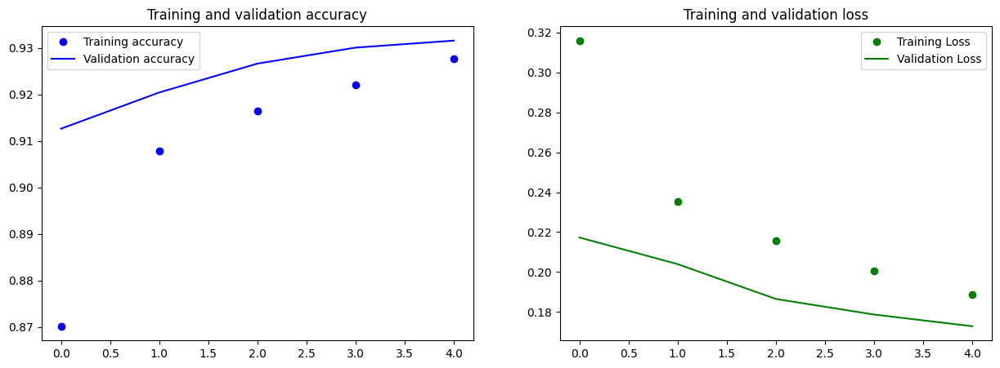

In [ ]:
#@title
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(epochs, loss, 'go', label='Training Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
test_loss, test_acc = model.evaluate(validation_data, steps=len(validation_data), verbose=1)
print('Loss: %.3f' % (test_loss))
print('Accuracy: %.3f' % (test_acc * 100.0)) 

937/937 [==============================] - 31s 33ms/step - loss: 0.1729 - accuracy: 0.9316
Loss: 0.173
Accuracy: 93.158


# #VGG Model

In [ ]:
base_model = keras.applications.vgg16.VGG16(weights="imagenet", include_top=False, input_shape=(WIDTH,HEIGHT,3))
base_model.trainable = False ## Not trainable weights

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 64, 64, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 64, 64, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 32, 32, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 32, 32, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 32, 32, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 16, 16, 128)       0     

In [ ]:
from tensorflow.keras.layers import *

model1 = keras.models.Sequential()
model1.add(base_model)
model1.add(Flatten())
model1.add(Dense(128, activation='relu'))
model1.add(Dropout(0.2))
model1.add(Dense(2, activation='softmax'))
opt = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
model1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
history = model1.fit(training_data,
            epochs=3,
            validation_data=validation_data,
            validation_steps=valid_set.shape[0]//batch_size,
            steps_per_epoch=train_set.shape[0]//batch_size, 
            )

Epoch 1/3
3745/3745 [==============================] - 287s 76ms/step - loss: 0.2619 - accuracy: 0.8932 - val_loss: 0.2265 - val_accuracy: 0.9065
Epoch 2/3
3745/3745 [==============================] - 286s 76ms/step - loss: 0.2383 - accuracy: 0.9046 - val_loss: 0.2105 - val_accuracy: 0.9141
Epoch 3/3
3745/3745 [==============================] - 286s 76ms/step - loss: 0.2305 - accuracy: 0.9082 - val_loss: 0.2011 - val_accuracy: 0.9207


In [ ]:
model1.layers[0].trainable=True

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('model1.h5',save_best_only=True)
earlystop_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

opt = keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)
model1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

history = model1.fit(training_data,
            epochs=2,
            validation_data=validation_data,
            validation_steps=valid_set.shape[0]//batch_size,
            steps_per_epoch=train_set.shape[0]//batch_size)

Epoch 1/2
3745/3745 [==============================] - 290s 77ms/step - loss: 0.1440 - accuracy: 0.9470 - val_loss: 0.1516 - val_accuracy: 0.9395
Epoch 2/2
3745/3745 [==============================] - 286s 76ms/step - loss: 0.1068 - accuracy: 0.9613 - val_loss: 0.0968 - val_accuracy: 0.9647


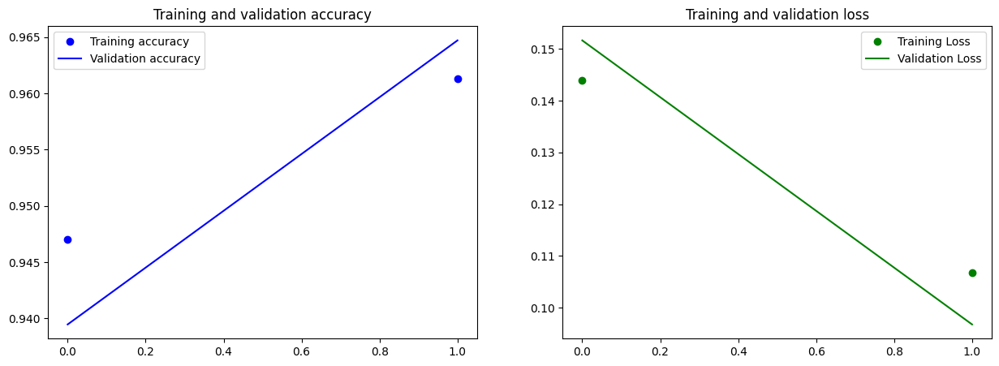

In [ ]:
#@title
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(epochs, loss, 'go', label='Training Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()


In [ ]:
test_loss, test_acc = model1.evaluate(validation_data, steps=len(validation_data), verbose=1)
print('Loss: %.3f' % (test_loss))
print('Accuracy: %.3f' % (test_acc * 100.0))

937/937 [==============================] - 31s 33ms/step - loss: 0.0967 - accuracy: 0.9647
Loss: 0.097
Accuracy: 96.472


## Predictions

In [ ]:
input_path1 = []

for path in os.listdir("/content/test"):
  input_path1.append(os.path.join("/content/test", path))
print(input_path1)

['/content/test/cover.jpg', '/content/test/Screenshot 2023-03-30 at 5.28.58 PM.png', '/content/test/download.jpeg']


In [ ]:
df1 = pd.DataFrame()
df1['images'] = input_path1
df1 = df1.sample(frac=1).reset_index(drop=True)
df1

,images
0,/content/test/Screenshot 2023-03-30 at 5.28.58...
1,/content/test/cover.jpg
2,/content/test/download.jpeg


In [ ]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(df1, 
                                                
                                                x_col='images',
                                                y_col=None,
                                                class_mode=None,
                                                target_size=(WIDTH,HEIGHT),
                                                batch_size=batch_size,
                                                shuffle=False)

Found 3 validated image filenames.


## Custom CNN

In [ ]:
prediction = model.predict(test_generator, steps=np.ceil(df1.shape[0]/batch_size))

1/1 [==============================] - 1s 522ms/step


In [ ]:
print(prediction)

[[0.00931611 0.9906839 ]
 [0.9894666  0.01053332]
 [0.9524954  0.04750456]]


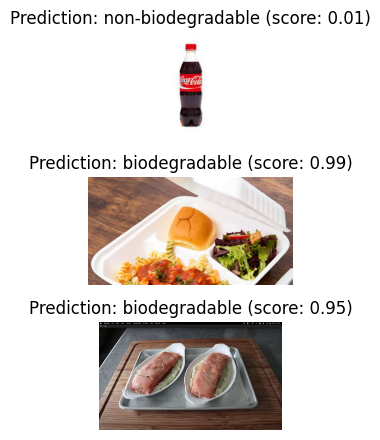

In [ ]:
fig, axs = plt.subplots(nrows=len(test_generator.filenames), figsize=(6, 1.5*len(test_generator.filenames)))
for i in range(len(test_generator.filenames)):
    filename = test_generator.filenames[i]
    prediction_Custom = prediction[i][0] 
    label = 'biodegradable' if prediction_Custom >= 0.5 else 'non-biodegradable'
    img_path = os.path.join('/content/df1', filename)
    img = Image.open(img_path)
    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title(f"Prediction: {label} (score: {float(prediction_Custom):.2f})") 
plt.tight_layout()
plt.show()

## VGG CNN

In [ ]:
prediction1 = model1.predict(test_generator, steps=np.ceil(df1.shape[0]/batch_size))

1/1 [==============================] - 1s 650ms/step


In [ ]:
print(prediction1)

[[0.00695765 0.99304235]
 [0.99848974 0.00151024]
 [0.9687555  0.0312445 ]]


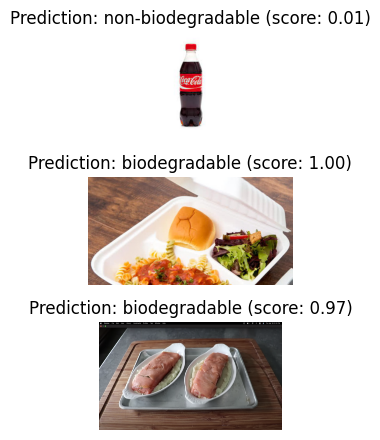

In [ ]:
fig, axs = plt.subplots(nrows=len(test_generator.filenames), figsize=(6, 1.5*len(test_generator.filenames)))
for i in range(len(test_generator.filenames)):
    filename = test_generator.filenames[i]
    prediction_Custom = prediction1[i][0] 
    label = 'biodegradable' if prediction_Custom >= 0.5 else 'non-biodegradable'
    img_path = os.path.join('/content/df1', filename)
    img = Image.open(img_path)
    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title(f"Prediction: {label} (score: {float(prediction_Custom):.2f})") 
plt.tight_layout()
plt.show()